# BIRD SPECIES CLASSIFICATION with DEEP LEARNING

<p style="text-align:center;"><img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcR-zuTVRKn8MQ4ZiHcK-WU1QoCzoYw_V7Yh9g&usqp=CAU" alt="Girl in a jacket" width="500" height="600" class="center"></p>

**Project Overview**

It is a project that uses transfer learning to predict 450 classes belonging to bird species. Data set of 400 bird species.58388 training images, 2000 test images(5 images per species) and 2000 validation images(5 images per species. This is a very high quality dataset where there is only one bird in each image and the bird typically takes up at least 50% of the pixels in the image. As a result even a moderatly complex model will achieve training and test accuracies in the mid 90% range.

To become one with data is significant in such projects. Therefore, visualization techniques are usually applied in the project. A pre-trained model of Keras (InceptionV3) is  used in the project. After reachin nearly %89 accuracy, fine-tuning is applied and the accuracy is improved to **%94**.

Steps followed during the development of the project:

* 1. Become One with Data
* 2. Data Preprocessing
* 3. Create a and fit the Model (Using InceptionV3 pre-trained model)
* 4. Freeze top layers of Base Model
* 5. Fine-tuning and Refitting 




## 1. Become one with the data

In [1]:
import os 

#walk through the directory and list the numbers of files
for dirpath, dirnames, filenames in os.walk("/kaggle/input/100-bird-species"):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in {dirpath}")

There are 4 directories and 3 images in /kaggle/input/100-bird-species
There are 450 directories and 0 images in /kaggle/input/100-bird-species/valid
There are 0 directories and 5 images in /kaggle/input/100-bird-species/valid/DALMATIAN PELICAN
There are 0 directories and 5 images in /kaggle/input/100-bird-species/valid/WATTLED CURASSOW
There are 0 directories and 5 images in /kaggle/input/100-bird-species/valid/AMERICAN WIGEON
There are 0 directories and 5 images in /kaggle/input/100-bird-species/valid/CARMINE BEE-EATER
There are 0 directories and 5 images in /kaggle/input/100-bird-species/valid/GAMBELS QUAIL
There are 0 directories and 5 images in /kaggle/input/100-bird-species/valid/UMBRELLA BIRD
There are 0 directories and 5 images in /kaggle/input/100-bird-species/valid/AMERICAN KESTREL
There are 0 directories and 5 images in /kaggle/input/100-bird-species/valid/AMERICAN GOLDFINCH
There are 0 directories and 5 images in /kaggle/input/100-bird-species/valid/DUSKY LORY
There are 0 d

##### How many classes do we have?

In [2]:
num_of_bird_groups = len(os.listdir("/kaggle/input/100-bird-species/train"))
num_of_bird_groups

450

##### What are the class names?

In [3]:
import pathlib 
import numpy as np

data_dir = pathlib.Path("/kaggle/input/100-bird-species/train")
class_names = np.array(sorted([item.name for item in data_dir.glob("*")])) # creating a list of class names from subdirectory 
print(class_names)

['ABBOTTS BABBLER' 'ABBOTTS BOOBY' 'ABYSSINIAN GROUND HORNBILL'
 'AFRICAN CROWNED CRANE' 'AFRICAN EMERALD CUCKOO' 'AFRICAN FIREFINCH'
 'AFRICAN OYSTER CATCHER' 'AFRICAN PIED HORNBILL' 'ALBATROSS'
 'ALBERTS TOWHEE' 'ALEXANDRINE PARAKEET' 'ALPINE CHOUGH'
 'ALTAMIRA YELLOWTHROAT' 'AMERICAN AVOCET' 'AMERICAN BITTERN'
 'AMERICAN COOT' 'AMERICAN FLAMINGO' 'AMERICAN GOLDFINCH'
 'AMERICAN KESTREL' 'AMERICAN PIPIT' 'AMERICAN REDSTART' 'AMERICAN WIGEON'
 'AMETHYST WOODSTAR' 'ANDEAN GOOSE' 'ANDEAN LAPWING' 'ANDEAN SISKIN'
 'ANHINGA' 'ANIANIAU' 'ANNAS HUMMINGBIRD' 'ANTBIRD' 'ANTILLEAN EUPHONIA'
 'APAPANE' 'APOSTLEBIRD' 'ARARIPE MANAKIN' 'ASHY STORM PETREL'
 'ASHY THRUSHBIRD' 'ASIAN CRESTED IBIS' 'ASIAN DOLLARD BIRD'
 'AUCKLAND SHAQ' 'AUSTRAL CANASTERO' 'AUSTRALASIAN FIGBIRD' 'AVADAVAT'
 'AZARAS SPINETAIL' 'AZURE BREASTED PITTA' 'AZURE JAY' 'AZURE TANAGER'
 'AZURE TIT' 'BAIKAL TEAL' 'BALD EAGLE' 'BALD IBIS' 'BALI STARLING'
 'BALTIMORE ORIOLE' 'BANANAQUIT' 'BAND TAILED GUAN' 'BANDED BROADBILL'
 'BAN

##### A function to visualize images randomly

In [4]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def view_random_image(target_dir, target_class):
  # setting up the image directory
  target_folder = target_dir + target_class

  #get a random image path
  random_image = random.sample(os.listdir(target_folder), 1)

  #read image and plotting it
  img = mpimg.imread(target_folder + "/" + random_image[0] )
  plt.imshow(img)
  plt.title(target_class)
  plt.axis("off")

  print(f"Image shape: {img.shape}")
  
  return img

Image shape: (224, 224, 3)


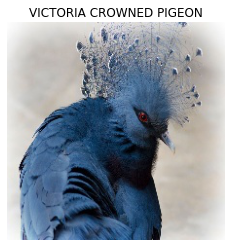

In [5]:
img = view_random_image(target_dir = "/kaggle/input/100-bird-species/train/",
                        target_class = "VICTORIA CROWNED PIGEON") # or we can write nike instead of converse to see converse examples

In [6]:
import tensorflow as tf
img.shape #(width, height, colour channels)

(224, 224, 3)

##### More visualization :D

Image shape: (224, 224, 3)
Image shape: (224, 224, 3)
Image shape: (224, 224, 3)


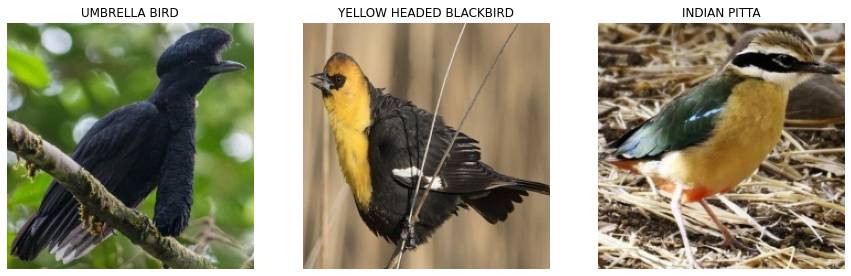

In [7]:
plt.figure(figsize = (15,7))
plt.subplot(1,3,1)
steak_image = view_random_image("/kaggle/input/100-bird-species/train/", "UMBRELLA BIRD")
plt.subplot(1,3,2)
pizza_image = view_random_image("/kaggle/input/100-bird-species/train/", "YELLOW HEADED BLACKBIRD")
plt.subplot(1,3,3)
pizza_image = view_random_image("/kaggle/input/100-bird-species/train/", "INDIAN PITTA")

## 2. Data Preprocessing

In [8]:
import matplotlib.pyplot as plt
import pathlib, os, random
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow as tf

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Activation, BatchNormalization, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Sequential

In [9]:
train_dir = "/kaggle/input/100-bird-species/train/"
test_dir = "/kaggle/input/100-bird-species/test/"
val_dir = "/kaggle/input/100-bird-species/valid/"

In [10]:
# Rescale
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
valid_datagen = ImageDataGenerator(rescale = 1./255)

# data transfer from directories to batches
train_data = train_datagen.flow_from_directory(directory = train_dir,
                                               batch_size= 64,
                                               target_size= (224,224),
                                               class_mode = "categorical")

test_data = test_datagen.flow_from_directory(directory = test_dir,
                                               batch_size = 64,
                                               target_size = (224,224),
                                               class_mode = "categorical")

val_data = valid_datagen.flow_from_directory(directory = val_dir,
                                               batch_size = 64,
                                               target_size = (224,224),
                                               class_mode = "categorical")


Found 70626 images belonging to 450 classes.
Found 2250 images belonging to 450 classes.
Found 2250 images belonging to 450 classes.


## 3.Creating and fitting the Model

Model with 5 epoch, RMSProp, learning_rate=0.0001, momentum=0.95


In [11]:
# 1. Create a base model with tf.keras.applications

base_model = tf.keras.applications.InceptionV3(include_top= False,)

# 2. Freeze the base model
base_model.trainable = False

#3. Create inputs into models
inputs = tf.keras.layers.Input(shape =(300,300,3), name = "input-layer")

#4. Rescaling
#x = tf.keras.layers.experimental.preprocessing.Rescaling(1/255.)(inputs)

#5. Pass the inputs 
x = base_model(inputs)
print(f"Shape after passing inputs through base model: {x.shape}")

# 6. Average pool the outputs of the base model
x = tf.keras.layers.GlobalAveragePooling2D(name = "global_average_pooling_layer")(x)
print(f"Shape after GlobalAveragePooling2D: {x.shape}")

#7. Create the output activation layer
outputs = tf.keras.layers.Dense(450, activation = "softmax", name = "output-layer")(x)

# 8. Combine the inputs with outputs into a model
model_0 = tf.keras.Model(inputs, outputs)

# 9. Compile the model
model_0.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001,momentum=0.95),
                metrics = ["accuracy"])




2022-12-15 23:18:13.249569: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-15 23:18:13.363950: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-15 23:18:13.364782: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-15 23:18:13.366789: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

87924736/87910968 [==============================] - 3s 0us/step
Shape after passing inputs through base model: (None, 8, 8, 2048)
Shape after GlobalAveragePooling2D: (None, 2048)


In [12]:
history = model_0.fit(train_data,
                                 epochs=5,
                                 steps_per_epoch = len(train_data),
                                 validation_data = val_data,
                                 validation_steps = int(0.25*len(val_data)),)

2022-12-15 23:18:22.159694: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/5


2022-12-15 23:18:27.328284: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


1104/1104 [==============================] - 469s 416ms/step - loss: 1.7746 - accuracy: 0.5992 - val_loss: 0.8080 - val_accuracy: 0.7708
Epoch 2/5
1104/1104 [==============================] - 243s 220ms/step - loss: 0.9472 - accuracy: 0.7708 - val_loss: 0.6157 - val_accuracy: 0.8368
Epoch 3/5
1104/1104 [==============================] - 242s 219ms/step - loss: 0.7362 - accuracy: 0.8183 - val_loss: 0.7528 - val_accuracy: 0.8090
Epoch 4/5
1104/1104 [==============================] - 238s 216ms/step - loss: 0.6075 - accuracy: 0.8478 - val_loss: 0.6288 - val_accuracy: 0.8490
Epoch 5/5
1104/1104 [==============================] - 242s 219ms/step - loss: 0.5173 - accuracy: 0.8680 - val_loss: 0.5898 - val_accuracy: 0.8472


In [13]:
model_0.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input-layer (InputLayer)     [(None, 300, 300, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, None, None, 2048)  21802784  
_________________________________________________________________
global_average_pooling_layer (None, 2048)              0         
_________________________________________________________________
output-layer (Dense)         (None, 450)               922050    
Total params: 22,724,834
Trainable params: 922,050
Non-trainable params: 21,802,784
_________________________________________________________________


In [14]:
model_0.evaluate(test_data)

36/36 [==============================] - 15s 433ms/step - loss: 0.5654 - accuracy: 0.8698


[0.5653792023658752, 0.8697777986526489]

In [15]:
def plot_loss_curves(history):

  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  accuracy = history.history["accuracy"]
  val_accuracy = history.history["val_accuracy"]

  epochs = range(len(history.history["loss"]))

  #plot loss
  plt.plot(epochs, loss, label = "training_loss")
  plt.plot(epochs, val_loss, label = "val_loss")
  plt.title("loss")
  plt.xlabel("epochs")
  plt.legend()

  #plot accuracy
  plt.figure() 
  plt.plot(epochs, accuracy, label = "training_accuracy")
  plt.plot(epochs, val_accuracy, label = "val_accuracy")
  plt.title("accuracy")
  plt.xlabel("epochs")
  plt.legend()

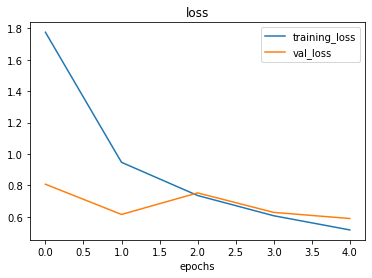

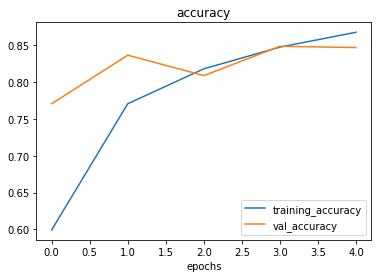

In [16]:
plot_loss_curves(history)

True Label: ABBOTTS BOOBY
Predicted Label: KILLDEAR


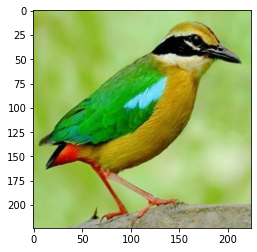

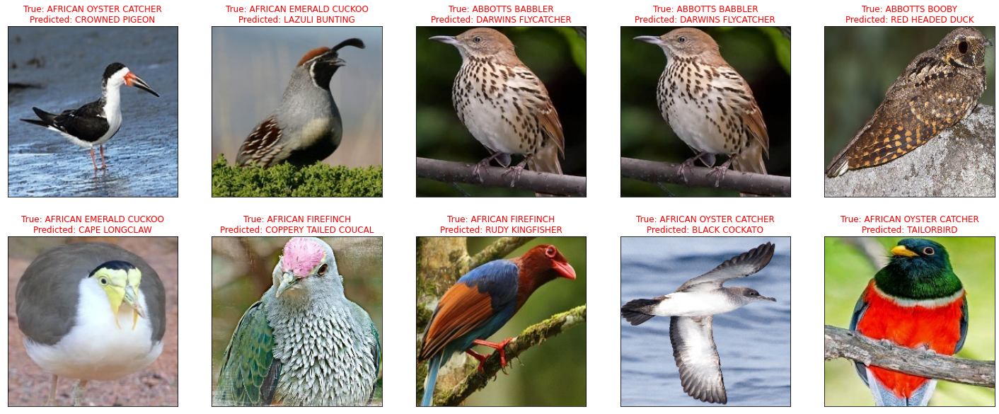

<Figure size 432x288 with 0 Axes>

In [17]:
pred = model_0.predict(test_data)
pred = np.argmax(pred,axis=1)

index =6

img , label = test_data[index]
label = test_data.labels[index]
print(f"True Label: {class_names[label]}")
print(f"Predicted Label: {class_names[pred[index]]}")  
plt.imshow(img[0])
plt.show()

# Display 10 random pictures from the dataset with their labels

random_index = np.random.randint(0, len(test_data) - 1, 10)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    randImg , randLabel = test_data[random_index[i]]
    randLabel = test_data.labels[random_index[i]]
    ax.imshow(randImg[0])
    if class_names[randLabel] == class_names[pred[random_index[i]]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {class_names[randLabel]}\nPredicted: {class_names[pred[random_index[i]]]}", color=color)
plt.show()
plt.tight_layout()

Model with 5 epoch, RMSProp, learning_rate=0.001, momentum=0.95


In [18]:
# 1. Create a base model with tf.keras.applications

base_model = tf.keras.applications.InceptionV3(include_top= False,)

# 2. Freeze the base model
base_model.trainable = False

#3. Create inputs into models
inputs = tf.keras.layers.Input(shape =(300,300,3), name = "input-layer")

#4. Rescaling
#x = tf.keras.layers.experimental.preprocessing.Rescaling(1/255.)(inputs)

#5. Pass the inputs 
x = base_model(inputs)
print(f"Shape after passing inputs through base model: {x.shape}")

# 6. Average pool the outputs of the base model
x = tf.keras.layers.GlobalAveragePooling2D(name = "global_average_pooling_layer")(x)
print(f"Shape after GlobalAveragePooling2D: {x.shape}")

#7. Create the output activation layer
outputs = tf.keras.layers.Dense(450, activation = "softmax", name = "output-layer")(x)

# 8. Combine the inputs with outputs into a model
model_1 = tf.keras.Model(inputs, outputs)

# 9. Compile the model
model_1.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.001,momentum=0.95),
                metrics = ["accuracy"])



Shape after passing inputs through base model: (None, 8, 8, 2048)
Shape after GlobalAveragePooling2D: (None, 2048)


In [19]:
history_1 = model_1.fit(train_data,
                                 epochs=5,
                                 steps_per_epoch = len(train_data),
                                 validation_data = val_data,
                                 validation_steps = int(0.25*len(val_data)),)

Epoch 1/5
1104/1104 [==============================] - 245s 219ms/step - loss: 11.0256 - accuracy: 0.4637 - val_loss: 6.3613 - val_accuracy: 0.6753
Epoch 2/5
1104/1104 [==============================] - 240s 218ms/step - loss: 7.8373 - accuracy: 0.6527 - val_loss: 5.2492 - val_accuracy: 0.7465
Epoch 3/5
1104/1104 [==============================] - 234s 212ms/step - loss: 6.3538 - accuracy: 0.7176 - val_loss: 5.8028 - val_accuracy: 0.7569
Epoch 4/5
1104/1104 [==============================] - 232s 210ms/step - loss: 5.6181 - accuracy: 0.7517 - val_loss: 4.4540 - val_accuracy: 0.8021
Epoch 5/5
1104/1104 [==============================] - 240s 218ms/step - loss: 4.9233 - accuracy: 0.7763 - val_loss: 4.9220 - val_accuracy: 0.7812


In [20]:
model_1.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input-layer (InputLayer)     [(None, 300, 300, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, None, None, 2048)  21802784  
_________________________________________________________________
global_average_pooling_layer (None, 2048)              0         
_________________________________________________________________
output-layer (Dense)         (None, 450)               922050    
Total params: 22,724,834
Trainable params: 922,050
Non-trainable params: 21,802,784
_________________________________________________________________


In [21]:
model_1.evaluate(test_data)

36/36 [==============================] - 8s 220ms/step - loss: 5.3787 - accuracy: 0.7849


[5.378681182861328, 0.7848888635635376]

In [22]:
def plot_loss_curves(history_1):

  loss = history_1.history["loss"]
  val_loss = history_1.history["val_loss"]

  accuracy = history_1.history["accuracy"]
  val_accuracy = history_1.history["val_accuracy"]

  epochs = range(len(history_1.history["loss"]))

  #plot loss
  plt.plot(epochs, loss, label = "training_loss")
  plt.plot(epochs, val_loss, label = "val_loss")
  plt.title("loss")
  plt.xlabel("epochs")
  plt.legend()

  #plot accuracy
  plt.figure() 
  plt.plot(epochs, accuracy, label = "training_accuracy")
  plt.plot(epochs, val_accuracy, label = "val_accuracy")
  plt.title("accuracy")
  plt.xlabel("epochs")
  plt.legend()

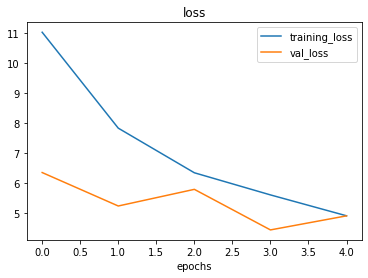

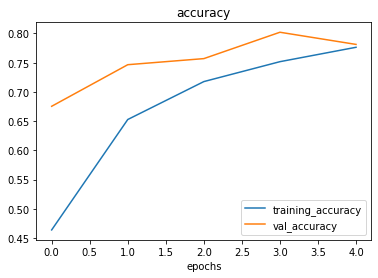

In [23]:
plot_loss_curves(history_1)

True Label: ABBOTTS BOOBY
Predicted Label: PINK ROBIN


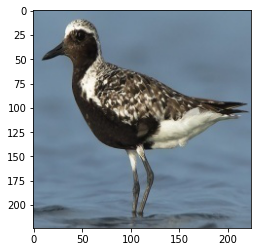

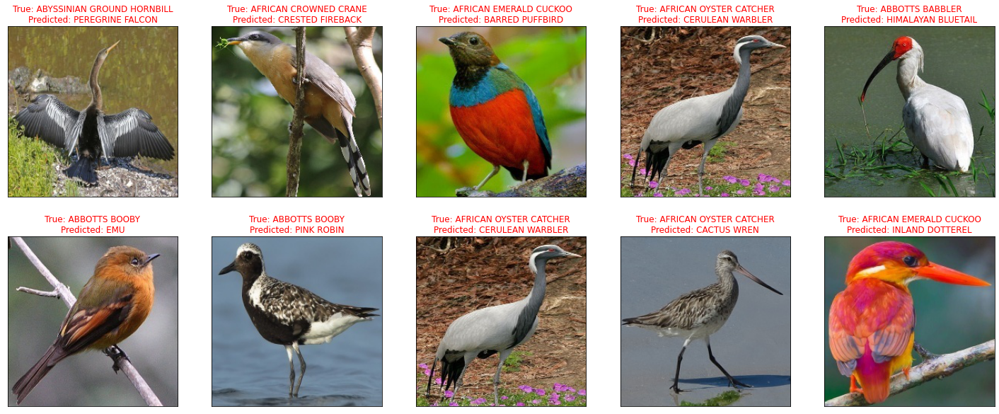

<Figure size 432x288 with 0 Axes>

In [24]:
pred = model_1.predict(test_data)
pred = np.argmax(pred,axis=1)

index =6

img , label = test_data[index]
label = test_data.labels[index]
print(f"True Label: {class_names[label]}")
print(f"Predicted Label: {class_names[pred[index]]}")  
plt.imshow(img[0])
plt.show()

# Display 10 random pictures from the dataset with their labels

random_index = np.random.randint(0, len(test_data) - 1, 10)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    randImg , randLabel = test_data[random_index[i]]
    randLabel = test_data.labels[random_index[i]]
    ax.imshow(randImg[0])
    if class_names[randLabel] == class_names[pred[random_index[i]]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {class_names[randLabel]}\nPredicted: {class_names[pred[random_index[i]]]}", color=color)
plt.show()
plt.tight_layout()

Model with 5 epoch, RMSProp, learning_rate=0.01, momentum=0.95


In [25]:
# 1. Create a base model with tf.keras.applications

base_model = tf.keras.applications.InceptionV3(include_top= False,)

# 2. Freeze the base model
base_model.trainable = False

#3. Create inputs into models
inputs = tf.keras.layers.Input(shape =(300,300,3), name = "input-layer")

#4. Rescaling
#x = tf.keras.layers.experimental.preprocessing.Rescaling(1/255.)(inputs)

#5. Pass the inputs 
x = base_model(inputs)
print(f"Shape after passing inputs through base model: {x.shape}")

# 6. Average pool the outputs of the base model
x = tf.keras.layers.GlobalAveragePooling2D(name = "global_average_pooling_layer")(x)
print(f"Shape after GlobalAveragePooling2D: {x.shape}")

#7. Create the output activation layer
outputs = tf.keras.layers.Dense(450, activation = "softmax", name = "output-layer")(x)

# 8. Combine the inputs with outputs into a model
model_2 = tf.keras.Model(inputs, outputs)

# 9. Compile the model
model_2.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.01,momentum=0.95),
                metrics = ["accuracy"])



Shape after passing inputs through base model: (None, 8, 8, 2048)
Shape after GlobalAveragePooling2D: (None, 2048)


In [26]:
history_2 = model_2.fit(train_data,
                                 epochs=5,
                                 steps_per_epoch = len(train_data),
                                 validation_data = val_data,
                                 validation_steps = int(0.25*len(val_data)),)

Epoch 1/5
1104/1104 [==============================] - 233s 208ms/step - loss: 129.3987 - accuracy: 0.4241 - val_loss: 75.0216 - val_accuracy: 0.6424
Epoch 2/5
1104/1104 [==============================] - 240s 217ms/step - loss: 84.9001 - accuracy: 0.6266 - val_loss: 57.7610 - val_accuracy: 0.6927
Epoch 3/5
1104/1104 [==============================] - 240s 217ms/step - loss: 69.6003 - accuracy: 0.6942 - val_loss: 59.8396 - val_accuracy: 0.7257
Epoch 4/5
1104/1104 [==============================] - 231s 209ms/step - loss: 59.8767 - accuracy: 0.7331 - val_loss: 48.8324 - val_accuracy: 0.7639
Epoch 5/5
1104/1104 [==============================] - 242s 219ms/step - loss: 53.5181 - accuracy: 0.7596 - val_loss: 56.0274 - val_accuracy: 0.7639


In [27]:
model_2.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input-layer (InputLayer)     [(None, 300, 300, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, None, None, 2048)  21802784  
_________________________________________________________________
global_average_pooling_layer (None, 2048)              0         
_________________________________________________________________
output-layer (Dense)         (None, 450)               922050    
Total params: 22,724,834
Trainable params: 922,050
Non-trainable params: 21,802,784
_________________________________________________________________


In [28]:
model_2.evaluate(test_data)

36/36 [==============================] - 7s 204ms/step - loss: 45.6580 - accuracy: 0.7818


[45.65798568725586, 0.7817777991294861]

In [29]:
def plot_loss_curves(history_2):

  loss = history_2.history["loss"]
  val_loss = history_2.history["val_loss"]

  accuracy = history_2.history["accuracy"]
  val_accuracy = history_2.history["val_accuracy"]

  epochs = range(len(history_2.history["loss"]))

  #plot loss
  plt.plot(epochs, loss, label = "training_loss")
  plt.plot(epochs, val_loss, label = "val_loss")
  plt.title("loss")
  plt.xlabel("epochs")
  plt.legend()

  #plot accuracy
  plt.figure() 
  plt.plot(epochs, accuracy, label = "training_accuracy")
  plt.plot(epochs, val_accuracy, label = "val_accuracy")
  plt.title("accuracy")
  plt.xlabel("epochs")
  plt.legend()

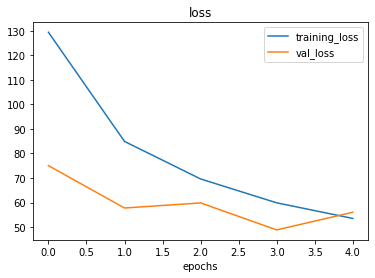

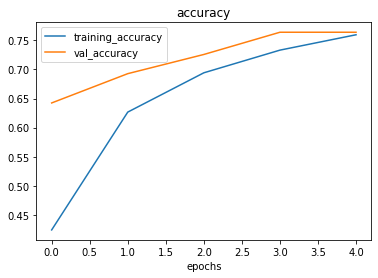

In [30]:
plot_loss_curves(history_2)

True Label: ABBOTTS BOOBY
Predicted Label: AZURE BREASTED PITTA


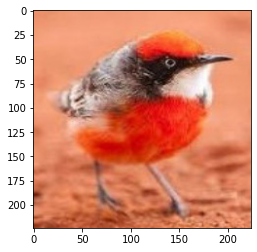

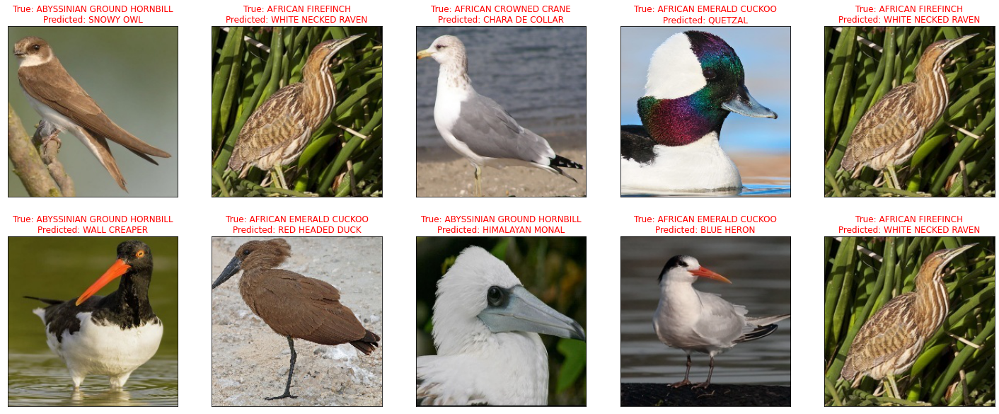

<Figure size 432x288 with 0 Axes>

In [31]:
pred = model_2.predict(test_data)
pred = np.argmax(pred,axis=1)

index =6

img , label = test_data[index]
label = test_data.labels[index]
print(f"True Label: {class_names[label]}")
print(f"Predicted Label: {class_names[pred[index]]}")  
plt.imshow(img[0])
plt.show()

# Display 10 random pictures from the dataset with their labels

random_index = np.random.randint(0, len(test_data) - 1, 10)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    randImg , randLabel = test_data[random_index[i]]
    randLabel = test_data.labels[random_index[i]]
    ax.imshow(randImg[0])
    if class_names[randLabel] == class_names[pred[random_index[i]]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {class_names[randLabel]}\nPredicted: {class_names[pred[random_index[i]]]}", color=color)
plt.show()
plt.tight_layout()

Model with 5 epoch, RMSProp, learning_rate=0.0001, momentum=0.9


In [32]:
# 1. Create a base model with tf.keras.applications

base_model = tf.keras.applications.InceptionV3(include_top= False,)

# 2. Freeze the base model
base_model.trainable = False

#3. Create inputs into models
inputs = tf.keras.layers.Input(shape =(300,300,3), name = "input-layer")

#4. Rescaling
#x = tf.keras.layers.experimental.preprocessing.Rescaling(1/255.)(inputs)

#5. Pass the inputs 
x = base_model(inputs)
print(f"Shape after passing inputs through base model: {x.shape}")

# 6. Average pool the outputs of the base model
x = tf.keras.layers.GlobalAveragePooling2D(name = "global_average_pooling_layer")(x)
print(f"Shape after GlobalAveragePooling2D: {x.shape}")

#7. Create the output activation layer
outputs = tf.keras.layers.Dense(450, activation = "softmax", name = "output-layer")(x)

# 8. Combine the inputs with outputs into a model
model_3 = tf.keras.Model(inputs, outputs)

# 9. Compile the model
model_3.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001,momentum=0.9),
                metrics = ["accuracy"])


Shape after passing inputs through base model: (None, 8, 8, 2048)
Shape after GlobalAveragePooling2D: (None, 2048)


In [33]:
history_3 = model_3.fit(train_data,
                                 epochs=5,
                                 steps_per_epoch = len(train_data),
                                 validation_data = val_data,
                                 validation_steps = int(0.25*len(val_data)),)

Epoch 1/5
1104/1104 [==============================] - 243s 216ms/step - loss: 1.6871 - accuracy: 0.6068 - val_loss: 0.7375 - val_accuracy: 0.8090
Epoch 2/5
1104/1104 [==============================] - 236s 213ms/step - loss: 0.8442 - accuracy: 0.7806 - val_loss: 0.5510 - val_accuracy: 0.8299
Epoch 3/5
1104/1104 [==============================] - 238s 215ms/step - loss: 0.6584 - accuracy: 0.8272 - val_loss: 0.5637 - val_accuracy: 0.8420
Epoch 4/5
1104/1104 [==============================] - 239s 217ms/step - loss: 0.5543 - accuracy: 0.8543 - val_loss: 0.4520 - val_accuracy: 0.8750
Epoch 5/5
1104/1104 [==============================] - 238s 216ms/step - loss: 0.4767 - accuracy: 0.8747 - val_loss: 0.4263 - val_accuracy: 0.8924


In [34]:
model_3.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input-layer (InputLayer)     [(None, 300, 300, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, None, None, 2048)  21802784  
_________________________________________________________________
global_average_pooling_layer (None, 2048)              0         
_________________________________________________________________
output-layer (Dense)         (None, 450)               922050    
Total params: 22,724,834
Trainable params: 922,050
Non-trainable params: 21,802,784
_________________________________________________________________


In [35]:
model_3.evaluate(test_data)

36/36 [==============================] - 8s 210ms/step - loss: 0.4256 - accuracy: 0.8853


[0.42556077241897583, 0.8853333592414856]

In [36]:
def plot_loss_curves(history_3):

  loss = history_3.history["loss"]
  val_loss = history_3.history["val_loss"]

  accuracy = history_3.history["accuracy"]
  val_accuracy = history_3.history["val_accuracy"]

  epochs = range(len(history_3.history["loss"]))

  #plot loss
  plt.plot(epochs, loss, label = "training_loss")
  plt.plot(epochs, val_loss, label = "val_loss")
  plt.title("loss")
  plt.xlabel("epochs")
  plt.legend()

  #plot accuracy
  plt.figure() 
  plt.plot(epochs, accuracy, label = "training_accuracy")
  plt.plot(epochs, val_accuracy, label = "val_accuracy")
  plt.title("accuracy")
  plt.xlabel("epochs")
  plt.legend()

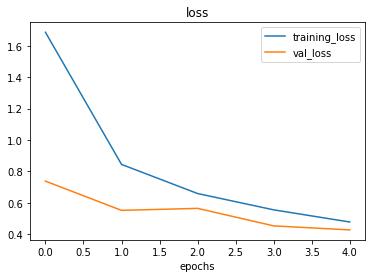

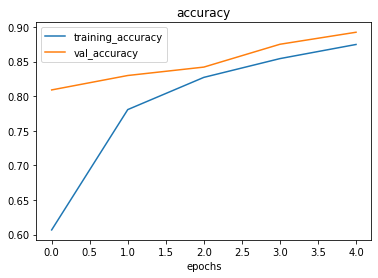

In [37]:
plot_loss_curves(history_3)

True Label: ABBOTTS BOOBY
Predicted Label: RED WISKERED BULBUL


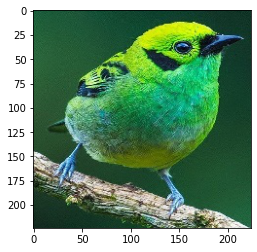

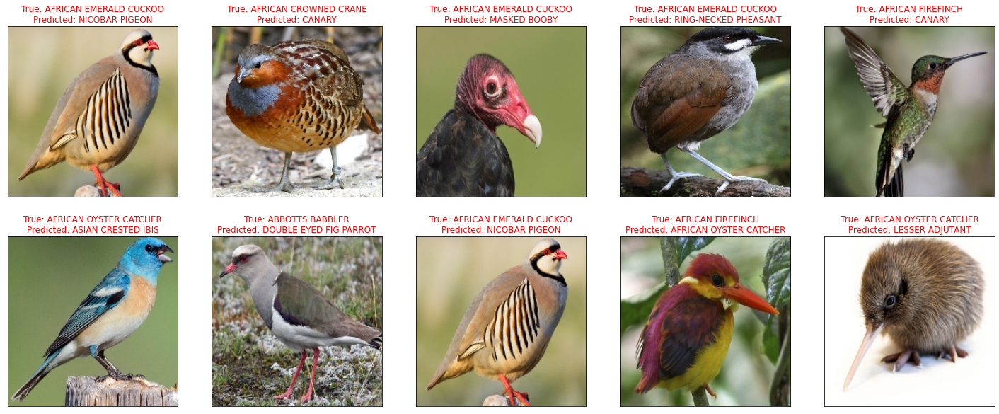

<Figure size 432x288 with 0 Axes>

In [38]:
pred = model_3.predict(test_data)
pred = np.argmax(pred,axis=1)

index =6

img , label = test_data[index]
label = test_data.labels[index]
print(f"True Label: {class_names[label]}")
print(f"Predicted Label: {class_names[pred[index]]}")  
plt.imshow(img[0])
plt.show()

# Display 10 random pictures from the dataset with their labels

random_index = np.random.randint(0, len(test_data) - 1, 10)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    randImg , randLabel = test_data[random_index[i]]
    randLabel = test_data.labels[random_index[i]]
    ax.imshow(randImg[0])
    if class_names[randLabel] == class_names[pred[random_index[i]]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {class_names[randLabel]}\nPredicted: {class_names[pred[random_index[i]]]}", color=color)
plt.show()
plt.tight_layout()

Model with 5 epoch, RMSProp, learning_rate=0.001, momentum=0.9


In [39]:
# 1. Create a base model with tf.keras.applications

base_model = tf.keras.applications.InceptionV3(include_top= False,)

# 2. Freeze the base model
base_model.trainable = False

#3. Create inputs into models
inputs = tf.keras.layers.Input(shape =(300,300,3), name = "input-layer")

#4. Rescaling
#x = tf.keras.layers.experimental.preprocessing.Rescaling(1/255.)(inputs)

#5. Pass the inputs 
x = base_model(inputs)
print(f"Shape after passing inputs through base model: {x.shape}")

# 6. Average pool the outputs of the base model
x = tf.keras.layers.GlobalAveragePooling2D(name = "global_average_pooling_layer")(x)
print(f"Shape after GlobalAveragePooling2D: {x.shape}")

#7. Create the output activation layer
outputs = tf.keras.layers.Dense(450, activation = "softmax", name = "output-layer")(x)

# 8. Combine the inputs with outputs into a model
model_4 = tf.keras.Model(inputs, outputs)

# 9. Compile the model
model_4.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.001,momentum=0.9),
                metrics = ["accuracy"])



Shape after passing inputs through base model: (None, 8, 8, 2048)
Shape after GlobalAveragePooling2D: (None, 2048)


In [40]:
history_4 = model_4.fit(train_data,
                                 epochs=5,
                                 steps_per_epoch = len(train_data),
                                 validation_data = val_data,
                                 validation_steps = int(0.25*len(val_data)),)

Epoch 1/5
1104/1104 [==============================] - 247s 221ms/step - loss: 5.5089 - accuracy: 0.4957 - val_loss: 3.0468 - val_accuracy: 0.6979
Epoch 2/5
1104/1104 [==============================] - 244s 221ms/step - loss: 3.8034 - accuracy: 0.6799 - val_loss: 2.3803 - val_accuracy: 0.7726
Epoch 3/5
1104/1104 [==============================] - 244s 221ms/step - loss: 3.0774 - accuracy: 0.7383 - val_loss: 2.6748 - val_accuracy: 0.7569
Epoch 4/5
1104/1104 [==============================] - 239s 217ms/step - loss: 2.6189 - accuracy: 0.7741 - val_loss: 2.8534 - val_accuracy: 0.7535
Epoch 5/5
1104/1104 [==============================] - 247s 223ms/step - loss: 2.3292 - accuracy: 0.7974 - val_loss: 2.7375 - val_accuracy: 0.7847


In [41]:
model_4.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input-layer (InputLayer)     [(None, 300, 300, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, None, None, 2048)  21802784  
_________________________________________________________________
global_average_pooling_layer (None, 2048)              0         
_________________________________________________________________
output-layer (Dense)         (None, 450)               922050    
Total params: 22,724,834
Trainable params: 922,050
Non-trainable params: 21,802,784
_________________________________________________________________


In [42]:
model_4.evaluate(test_data)

36/36 [==============================] - 8s 222ms/step - loss: 2.3122 - accuracy: 0.8116


[2.31221866607666, 0.8115555644035339]

In [43]:
def plot_loss_curves(history_4):

  loss = history_4.history["loss"]
  val_loss = history_4.history["val_loss"]

  accuracy = history_4.history["accuracy"]
  val_accuracy = history_4.history["val_accuracy"]

  epochs = range(len(history_4.history["loss"]))

  #plot loss
  plt.plot(epochs, loss, label = "training_loss")
  plt.plot(epochs, val_loss, label = "val_loss")
  plt.title("loss")
  plt.xlabel("epochs")
  plt.legend()

  #plot accuracy
  plt.figure() 
  plt.plot(epochs, accuracy, label = "training_accuracy")
  plt.plot(epochs, val_accuracy, label = "val_accuracy")
  plt.title("accuracy")
  plt.xlabel("epochs")
  plt.legend()

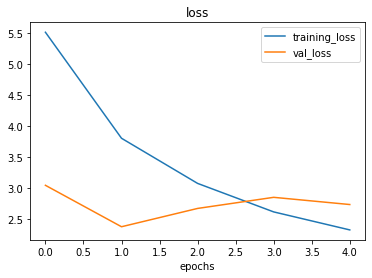

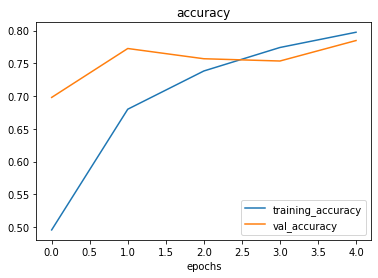

In [44]:
plot_loss_curves(history_4)

True Label: ABBOTTS BOOBY
Predicted Label: CRESTED AUKLET


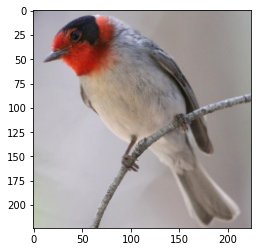

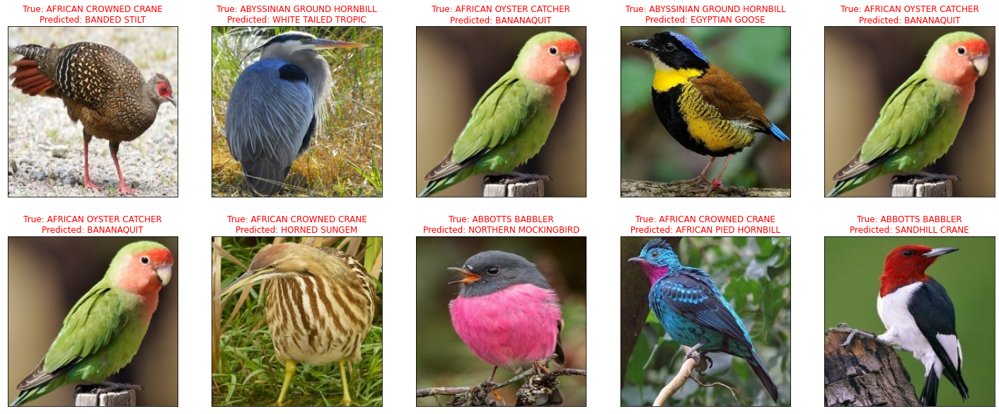

<Figure size 432x288 with 0 Axes>

In [45]:
pred = model_4.predict(test_data)
pred = np.argmax(pred,axis=1)

index =6

img , label = test_data[index]
label = test_data.labels[index]
print(f"True Label: {class_names[label]}")
print(f"Predicted Label: {class_names[pred[index]]}")  
plt.imshow(img[0])
plt.show()

# Display 10 random pictures from the dataset with their labels

random_index = np.random.randint(0, len(test_data) - 1, 10)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    randImg , randLabel = test_data[random_index[i]]
    randLabel = test_data.labels[random_index[i]]
    ax.imshow(randImg[0])
    if class_names[randLabel] == class_names[pred[random_index[i]]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {class_names[randLabel]}\nPredicted: {class_names[pred[random_index[i]]]}", color=color)
plt.show()
plt.tight_layout()

Model with 5 epoch, RMSProp, learning_rate=0.01, momentum=0.9


In [46]:
# 1. Create a base model with tf.keras.applications

base_model = tf.keras.applications.InceptionV3(include_top= False,)

# 2. Freeze the base model
base_model.trainable = False

#3. Create inputs into models
inputs = tf.keras.layers.Input(shape =(300,300,3), name = "input-layer")

#4. Rescaling
#x = tf.keras.layers.experimental.preprocessing.Rescaling(1/255.)(inputs)

#5. Pass the inputs 
x = base_model(inputs)
print(f"Shape after passing inputs through base model: {x.shape}")

# 6. Average pool the outputs of the base model
x = tf.keras.layers.GlobalAveragePooling2D(name = "global_average_pooling_layer")(x)
print(f"Shape after GlobalAveragePooling2D: {x.shape}")

#7. Create the output activation layer
outputs = tf.keras.layers.Dense(450, activation = "softmax", name = "output-layer")(x)

# 8. Combine the inputs with outputs into a model
model_5 = tf.keras.Model(inputs, outputs)

# 9. Compile the model
model_5.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.01,momentum=0.9),
                metrics = ["accuracy"])



Shape after passing inputs through base model: (None, 8, 8, 2048)
Shape after GlobalAveragePooling2D: (None, 2048)


In [47]:
history_5 = model_5.fit(train_data,
                                 epochs=5,
                                 steps_per_epoch = len(train_data),
                                 validation_data = val_data,
                                 validation_steps = int(0.25*len(val_data)),)

Epoch 1/5
1104/1104 [==============================] - 250s 223ms/step - loss: 66.7522 - accuracy: 0.4284 - val_loss: 32.6870 - val_accuracy: 0.6615
Epoch 2/5
1104/1104 [==============================] - 245s 222ms/step - loss: 42.6747 - accuracy: 0.6333 - val_loss: 33.4372 - val_accuracy: 0.6892
Epoch 3/5
1104/1104 [==============================] - 248s 225ms/step - loss: 35.4096 - accuracy: 0.7015 - val_loss: 33.1374 - val_accuracy: 0.7274
Epoch 4/5
1104/1104 [==============================] - 246s 223ms/step - loss: 30.5410 - accuracy: 0.7390 - val_loss: 31.7398 - val_accuracy: 0.7153
Epoch 5/5
1104/1104 [==============================] - 246s 223ms/step - loss: 27.4886 - accuracy: 0.7636 - val_loss: 23.7744 - val_accuracy: 0.7865


In [48]:
model_5.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input-layer (InputLayer)     [(None, 300, 300, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, None, None, 2048)  21802784  
_________________________________________________________________
global_average_pooling_layer (None, 2048)              0         
_________________________________________________________________
output-layer (Dense)         (None, 450)               922050    
Total params: 22,724,834
Trainable params: 922,050
Non-trainable params: 21,802,784
_________________________________________________________________


In [49]:
model_5.evaluate(test_data)

36/36 [==============================] - 8s 211ms/step - loss: 23.7471 - accuracy: 0.7924


[23.747135162353516, 0.7924444675445557]

In [50]:
def plot_loss_curves(history_5):

  loss = history_5.history["loss"]
  val_loss = history_5.history["val_loss"]

  accuracy = history_5.history["accuracy"]
  val_accuracy = history_5.history["val_accuracy"]

  epochs = range(len(history.history["loss"]))

  #plot loss
  plt.plot(epochs, loss, label = "training_loss")
  plt.plot(epochs, val_loss, label = "val_loss")
  plt.title("loss")
  plt.xlabel("epochs")
  plt.legend()

  #plot accuracy
  plt.figure() 
  plt.plot(epochs, accuracy, label = "training_accuracy")
  plt.plot(epochs, val_accuracy, label = "val_accuracy")
  plt.title("accuracy")
  plt.xlabel("epochs")
  plt.legend()

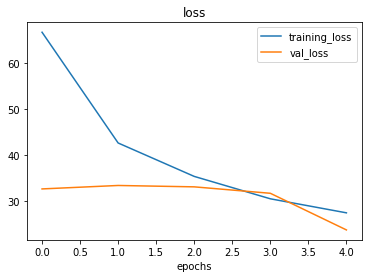

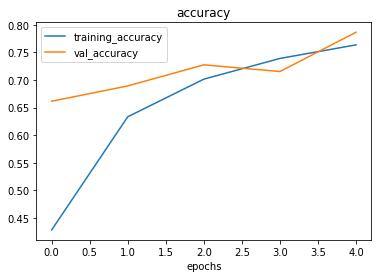

In [51]:
plot_loss_curves(history_5)

True Label: ABBOTTS BOOBY
Predicted Label: HORNED SUNGEM


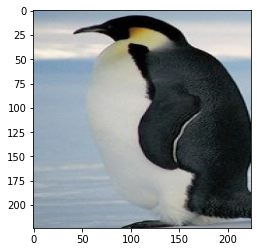

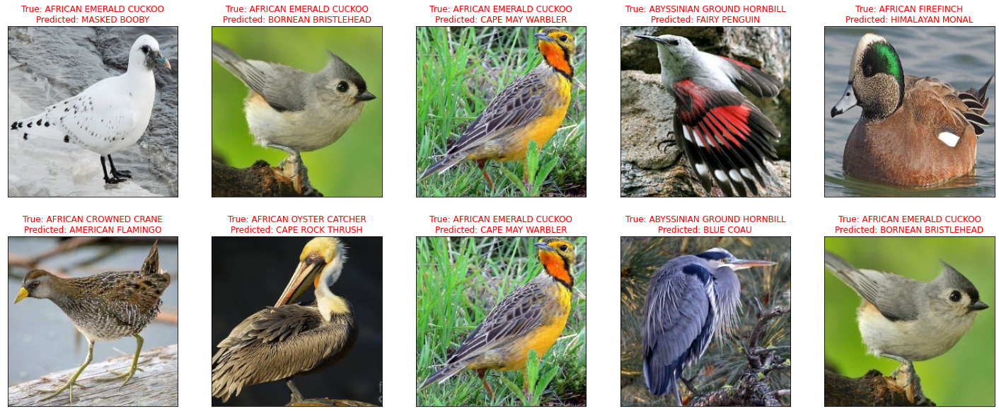

<Figure size 432x288 with 0 Axes>

In [52]:
pred = model_5.predict(test_data)
pred = np.argmax(pred,axis=1)

index =6

img , label = test_data[index]
label = test_data.labels[index]
print(f"True Label: {class_names[label]}")
print(f"Predicted Label: {class_names[pred[index]]}")  
plt.imshow(img[0])
plt.show()

# Display 10 random pictures from the dataset with their labels

random_index = np.random.randint(0, len(test_data) - 1, 10)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    randImg , randLabel = test_data[random_index[i]]
    randLabel = test_data.labels[random_index[i]]
    ax.imshow(randImg[0])
    if class_names[randLabel] == class_names[pred[random_index[i]]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {class_names[randLabel]}\nPredicted: {class_names[pred[random_index[i]]]}", color=color)
plt.show()
plt.tight_layout()